<a href="https://colab.research.google.com/github/dev02chandan/Image-Captioning/blob/main/Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Training setup

## Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
!pip install git+https://github.com/huggingface/transformers.git@main

  Cloning https://github.com/huggingface/transformers.git (to revision main) to /tmp/pip-req-build-suc2fb56
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-suc2fb56
  Resolved https://github.com/huggingface/transformers.git to commit 1c21f48a505c90378582681e93bba6de15e91adb
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 401.2/401.2 kB 5.0 MB/s eta 0:00:00
  Created wheel for transformers: filename=transformers-4.41.0.dev0-py3-none-any.whl size=9093349 sha256=1bfae9fbb54b92248c47f84eac4f10662309d5059d84924c75e33fede71204fe
  Stored in directory: /tmp/pip-ephem-wheel-cache-eg5mu6wq/wheels/cf/59/82/6492402e887a68975030bf8c06532260abc16abb7ccd8127cc
Successfully built transformers
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.20.3
    Uninst

In [ ]:
!pip install -q datasets

In [ ]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import BlipProcessor, BlipForConditionalGeneration, Trainer, TrainingArguments, AutoProcessor

In [ ]:
# Function to load images and captions
def load_data(root_dir):
    data = []
    categories = ["bed", "carpet", "chair", 'glass', 'sofa', 'wall']
    for category in categories:
        category_path = os.path.join(root_dir, category)
        for condition in os.listdir(category_path):
            condition_path = os.path.join(category_path, condition)
            if os.path.isdir(condition_path):  # Check if it's a directory
                for img_name in os.listdir(condition_path):
                    img_path = os.path.join(condition_path, img_name)
                    if os.path.isfile(img_path) and img_name.lower().endswith(('jpg', 'jpeg', 'png')):  # Check if it's an image file
                        image = Image.open(img_path).convert("RGB")
                        # if transform:
                        #     # image = transform(image)
                        caption = f"The condition of the {category} in the image is {condition.replace('_', ' ')}."
                        data.append((image, caption))
    return data

In [ ]:
# Load the data
data = load_data("/content/drive/MyDrive/Captioning/Organised Data")

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
print(data[0][0], data[0][1])

<PIL.Image.Image image mode=RGB size=2048x1350 at 0x7A798F1D78B0> The condition of the bed in the image is untidy.


## Create PyTorch Dataset

In [ ]:
from torch.utils.data import Dataset, DataLoader

class ImageCaptioningDataset(Dataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        encoding = self.processor(images=item[0], text=item[1], padding="max_length", return_tensors="pt")
        # remove batch dimension
        encoding = {k:v.squeeze() for k,v in encoding.items()}
        return encoding

## Load model and processor

In [ ]:
from transformers import AutoProcessor, BlipForConditionalGeneration

processor = AutoProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [ ]:
train_dataset = ImageCaptioningDataset(data, processor)
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=2)

## Train the model

In [ ]:
import torch

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

model.train()

for epoch in range(1):
  print("Epoch:", epoch)
  for idx, batch in enumerate(train_dataloader):
    input_ids = batch.pop("input_ids").to(device)
    pixel_values = batch.pop("pixel_values").to(device)
    attention_mask = batch.pop("attention_mask").to(device)

    outputs = model(
        input_ids=input_ids,
        pixel_values=pixel_values,
        attention_mask=attention_mask,
        labels=input_ids
      )

    loss = outputs.loss

    print("Loss:", loss.item())

    loss.backward()

    optimizer.step()
    optimizer.zero_grad()

Epoch: 0
Loss: 12.74299430847168
Loss: 9.71126651763916
Loss: 9.274134635925293
Loss: 8.818167686462402
Loss: 8.55720329284668
Loss: 8.338930130004883
Loss: 8.153288841247559
Loss: 8.001784324645996
Loss: 7.865445137023926
Loss: 7.714931964874268
Loss: 7.586066722869873
Loss: 7.4543585777282715
Loss: 7.324227333068848
Loss: 7.2086334228515625
Loss: 7.078980445861816
Loss: 6.954681873321533
Loss: 6.825708389282227
Loss: 6.700250625610352
Loss: 6.577796936035156
Loss: 6.457261085510254
Loss: 6.3406243324279785
Loss: 6.216620445251465
Loss: 6.090545654296875
Loss: 5.970126152038574
Loss: 5.858685493469238
Loss: 5.733269691467285
Loss: 5.607676982879639
Loss: 5.484501838684082
Loss: 5.356724739074707
Loss: 5.234625339508057
Loss: 5.108342170715332
Loss: 4.981791973114014
Loss: 4.850849151611328
Loss: 4.723437309265137
Loss: 4.602779865264893
Loss: 4.469200134277344
Loss: 4.349536895751953
Loss: 4.211315155029297
Loss: 4.083698749542236
Loss: 3.9545392990112305
Loss: 3.826550245285034
Loss:

In [ ]:
# Save the model
model.save_pretrained("/content")
processor.save_pretrained("/content")

[]

# Inference

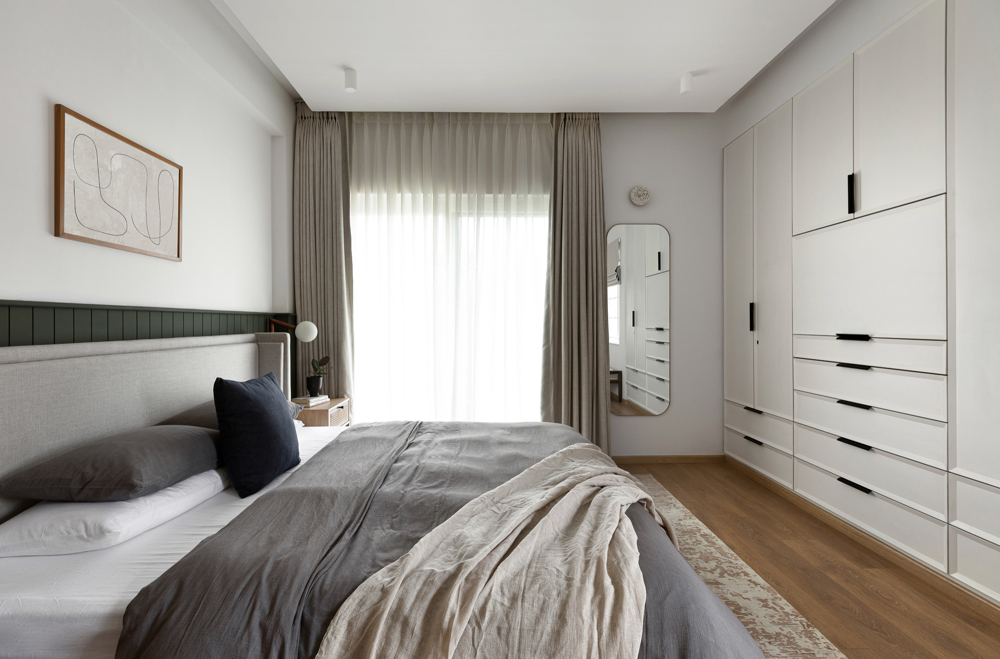

In [ ]:
# load image
example = data[0]
image = example[0]
image

In [ ]:
# prepare image for the model
inputs = processor(images=image, return_tensors="pt").to(device)
pixel_values = inputs.pixel_values

generated_ids = model.generate(pixel_values=pixel_values, max_length=50)
generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
print(generated_caption)

the condition of the bed in the image is tidy.


# Push to Hub

In [ ]:
from huggingface_hub import notebook_login
notebook_login()

In [ ]:
from huggingface_hub import HfApi, HfFolder, Repository
import os

In [ ]:
from google.colab import userdata
hf_token = userdata.get('hf_token')

In [ ]:
# Replace these with your information
model_name = "maitri-finetuned-blip"
hf_token = HfFolder.get_token()
username = "dev02chandan"  # Your Hugging Face username

# Create repository
api = HfApi()
api.create_repo("dev02chandan/maitri-finetuned-blip")

# Clone the repository
repo_url = f"https://huggingface.co/{username}/{model_name}"
repo = Repository(local_dir=model_name, clone_from=repo_url, use_auth_token=hf_token)

# Copy the model files to the repository directory
model_files = [
    "config.json",
    "generation_config.json",
    "model.safetensors",
    "preprocessor_config.json",
    "special_tokens_map.json",
    "tokenizer.json",
    "tokenizer_config.json",
    "vocab.txt"
]

for file_name in model_files:
    src_path = os.path.join("/content", file_name)  # Update with your path to the saved model files
    dst_path = os.path.join(model_name, file_name)
    os.system(f"cp {src_path} {dst_path}")

# Push to Hugging Face Hub
repo.push_to_hub()


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_deprecation.py:131: FutureWarning: 'Repository' (from 'huggingface_hub.repository') is deprecated and will be removed from version '1.0'. Please prefer the http-based alternatives instead. Given its large adoption in legacy code, the complete removal is only planned on next major release.
For more details, please read https://huggingface.co/docs/huggingface_hub/concepts/git_vs_http.
  warnings.warn(warning_message, FutureWarning)
Cloning https://huggingface.co/dev02chandan/maitri-finetuned-blip into local empty directory.


Upload file model.safetensors:   0%|          | 1.00/944M [00:00<?, ?B/s]

To https://huggingface.co/dev02chandan/maitri-finetuned-blip
   5c6ab60..d655c34  main -> main

   5c6ab60..d655c34  main -> main



'https://huggingface.co/dev02chandan/maitri-finetuned-blip/commit/d655c3461bc5a4c229cf23becbad4d832c4e4792'

# Load from the Hub and Infer

## Imports and Data

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import BlipProcessor, BlipForConditionalGeneration, Trainer, TrainingArguments, AutoProcessor

In [11]:
# Function to load images and captions
def load_data(root_dir):
    data = []
    categories = ["bed", "carpet", "chair", 'glass', 'sofa', 'wall']
    for category in categories:
        category_path = os.path.join(root_dir, category)
        for condition in os.listdir(category_path):
            condition_path = os.path.join(category_path, condition)
            if os.path.isdir(condition_path):  # Check if it's a directory
                for img_name in os.listdir(condition_path):
                    img_path = os.path.join(condition_path, img_name)
                    if os.path.isfile(img_path) and img_name.lower().endswith(('jpg', 'jpeg', 'png')):  # Check if it's an image file
                        image = Image.open(img_path).convert("RGB")
                        # if transform:
                        #     # image = transform(image)
                        caption = f"The condition of the {category} in the image is {condition.replace('_', ' ')}."
                        data.append((image, caption))
    return data

In [12]:
# Load the data
data = load_data("/content/drive/MyDrive/Captioning/Organised Data")

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [13]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [14]:
!pip install git+https://github.com/huggingface/transformers.git@main

  Cloning https://github.com/huggingface/transformers.git (to revision main) to /tmp/pip-req-build-jvbktal4
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-jvbktal4
  Resolved https://github.com/huggingface/transformers.git to commit 1c21f48a505c90378582681e93bba6de15e91adb
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## Examples

In [15]:
from transformers import BlipForConditionalGeneration, AutoProcessor

model = BlipForConditionalGeneration.from_pretrained("dev02chandan/maitri-finetuned-blip").to(device)
processor = AutoProcessor.from_pretrained("dev02chandan/maitri-finetuned-blip")

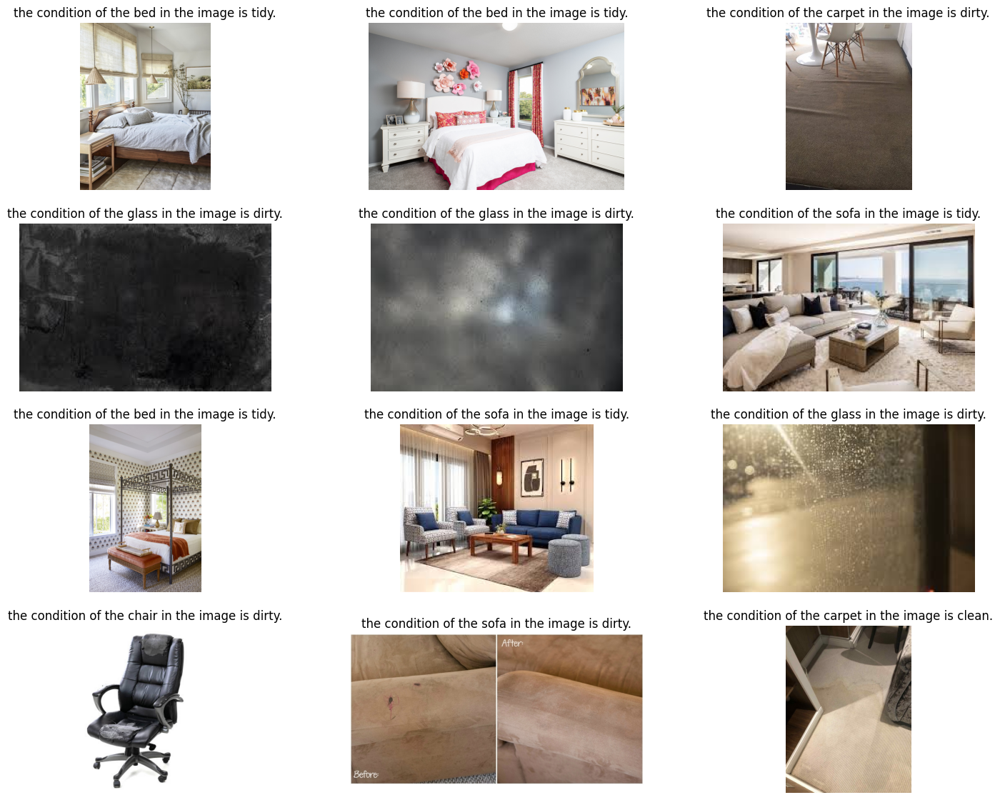

In [16]:
import random
from matplotlib import pyplot as plt
import numpy as np

# Number of images to display
num_images = 12

# Ensure to load only `num_images` random examples from the dataset
random_indices = random.sample(range(len(data)), num_images)

fig = plt.figure(figsize=(18, 14))

# Prepare and display images
for i, idx in enumerate(random_indices):
    example = data[idx]
    image = example[0]
    image = image.convert('RGB')
    inputs = processor(images=image, return_tensors="pt").to(device)
    pixel_values = inputs.pixel_values

    generated_ids = model.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    ax = fig.add_subplot(4, 3, i + 1)  # Adjust subplot grid to 3x4
    ax.imshow(np.array(image))  # Correctly permute dimensions for displaying
    ax.axis("off")
    ax.set_title(generated_caption)

plt.show()

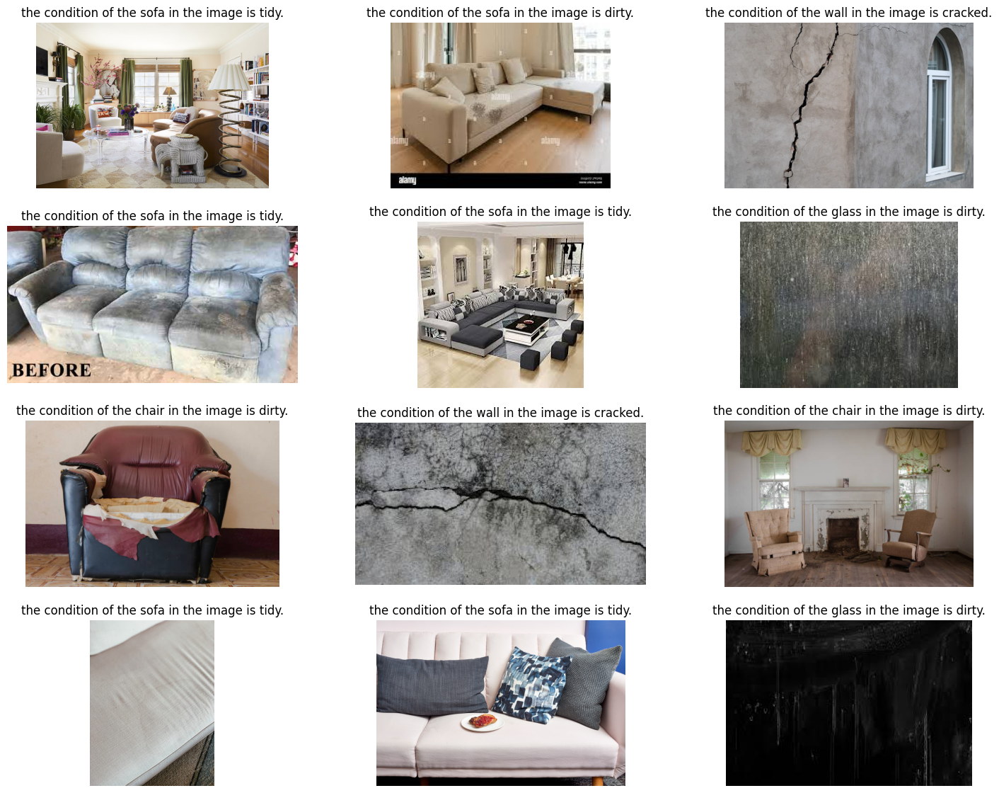

In [17]:
import random
from matplotlib import pyplot as plt
import numpy as np

# Number of images to display
num_images = 12

# Ensure to load only `num_images` random examples from the dataset
random_indices = random.sample(range(len(data)), num_images)

fig = plt.figure(figsize=(18, 14))

# Prepare and display images
for i, idx in enumerate(random_indices):
    example = data[idx]
    image = example[0]
    image = image.convert('RGB')
    inputs = processor(images=image, return_tensors="pt").to(device)
    pixel_values = inputs.pixel_values

    generated_ids = model.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    ax = fig.add_subplot(4, 3, i + 1)  # Adjust subplot grid to 3x4
    ax.imshow(np.array(image))  # Correctly permute dimensions for displaying
    ax.axis("off")
    ax.set_title(generated_caption)

plt.show()

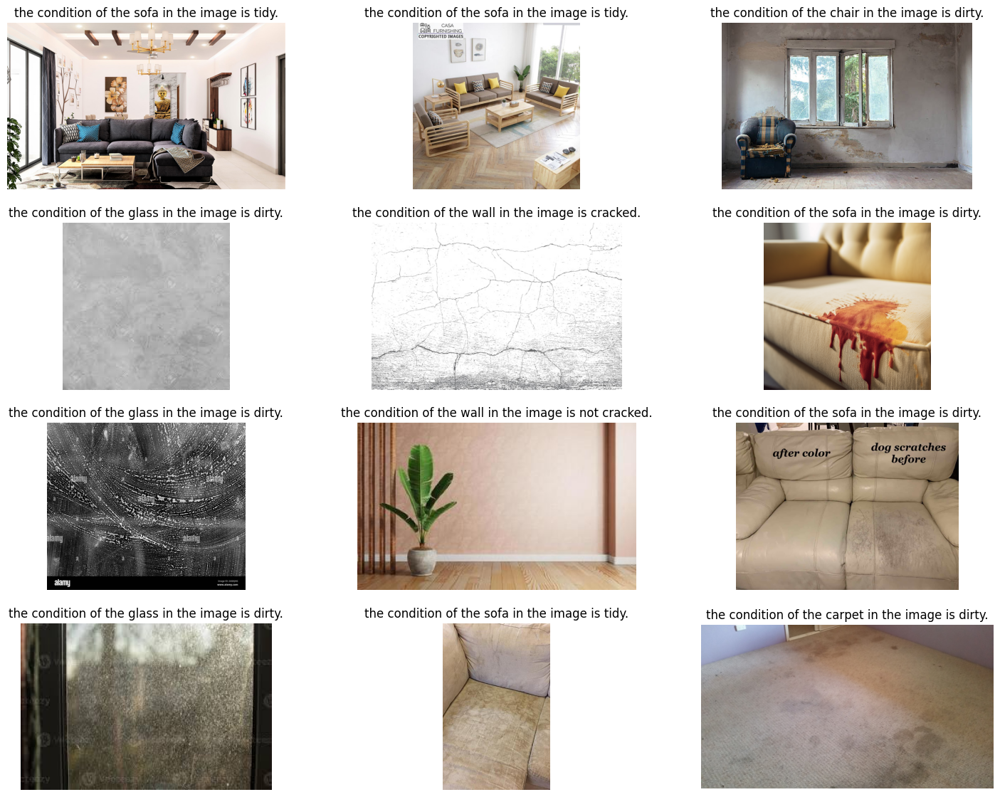

In [18]:
import random
from matplotlib import pyplot as plt
import numpy as np

# Number of images to display
num_images = 12

# Ensure to load only `num_images` random examples from the dataset
random_indices = random.sample(range(len(data)), num_images)

fig = plt.figure(figsize=(18, 14))

# Prepare and display images
for i, idx in enumerate(random_indices):
    example = data[idx]
    image = example[0]
    image = image.convert('RGB')
    inputs = processor(images=image, return_tensors="pt").to(device)
    pixel_values = inputs.pixel_values

    generated_ids = model.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    ax = fig.add_subplot(4, 3, i + 1)  # Adjust subplot grid to 3x4
    ax.imshow(np.array(image))  # Correctly permute dimensions for displaying
    ax.axis("off")
    ax.set_title(generated_caption)

plt.show()

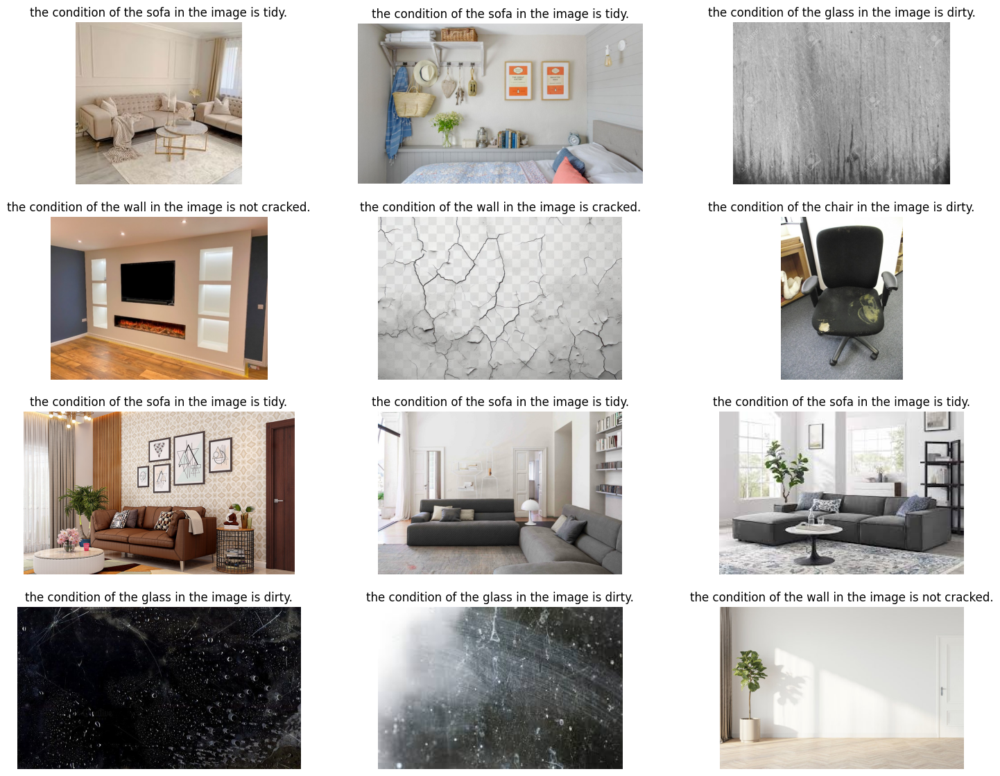

In [19]:
import random
from matplotlib import pyplot as plt
import numpy as np

# Number of images to display
num_images = 12

# Ensure to load only `num_images` random examples from the dataset
random_indices = random.sample(range(len(data)), num_images)

fig = plt.figure(figsize=(18, 14))

# Prepare and display images
for i, idx in enumerate(random_indices):
    example = data[idx]
    image = example[0]
    image = image.convert('RGB')
    inputs = processor(images=image, return_tensors="pt").to(device)
    pixel_values = inputs.pixel_values

    generated_ids = model.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    ax = fig.add_subplot(4, 3, i + 1)  # Adjust subplot grid to 3x4
    ax.imshow(np.array(image))  # Correctly permute dimensions for displaying
    ax.axis("off")
    ax.set_title(generated_caption)

plt.show()